# Thermal Gradient Figures

Setup:
- transducer 0, channel 1 in front of chamber
- transducer 1, channel 2 in back of chamber


In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('..') # path to the src directory
sys.path.append('/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/data_analysis/ultrasonicTesting/')
sys.path.append('/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/data_analysis/ultrasonic_ml/src/')

import pickleJar as pj
import sqliteUtils as squ
import numpy as np
from numpy import fft
import os.path
import matplotlib.pyplot as plt

import pickle

import matplotlib.pyplot as plt
from ipywidgets import interact
import ipywidgets as widgets
from datetime import datetime
import matplotlib.cm as cm
import pandas as pd

import ultrasonic_ml.gradient_helpers as gh

plt.rcParams.update({
        'font.family': 'Arial',
        'font.size': 16,
        'figure.dpi': 300,
        'savefig.dpi': 300,
    })

## Import Data

### exp set 1

In [2]:
sqliteFiles = [
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_20C_20C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_20.5C_19.5C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_21C_19C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_21.5C_18.5C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_22C_18C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_22.5C_17.5C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_23C_17C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_23.5C_16.5C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_24C_16C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_24.5C_15.5C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_25C_15C_chamber_min.sqlite3',
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_25.5C_14.5C_chamber_min.sqlite3',
                ]

monitor_file_path_list = [
   '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/CoSo_2026-08-05_23-46-43_Monitor.csv',
   
 ]

settings_file_path_list = [monitor_file_path.replace('_Monitor.csv', '_Settings.csv') for monitor_file_path in monitor_file_path_list]


### merge load pickles

In [5]:
# # Delete old pickle files
# gh.delete_old_pickles(sqliteFiles)

In [6]:
# Convert the sqlite3 to a .pickle
# This takes a few seconds. A progress bar will display in your terminal
pj.multiSqliteToPickle(sqliteFiles)

# Load the pickle
pickleFiles = [os.path.splitext(sqliteFile)[0] + '.pickle' for sqliteFile in sqliteFiles]
gh.stitch_interp_normalize_pickles(pickleFiles, 
                                            interp=False,
                                            saveName='combined.pickle', 
                                            save_directory='/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/', 
                                            num_points=7500, 
                                            overwrite_pickles=False,
                                            overwrite_combined=False)


Converting /Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_20C_20C_chamber_min.sqlite3

sqliteToPickle Warning: pickle file /Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_20C_20C_chamber_min.pickle already exists. Conversion aborted.

Converting /Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_20.5C_19.5C_chamber_min.sqlite3

sqliteToPickle Warning: pickle file /Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/stability_butyl_20.5C_19.5C_chamber_min.pickle already exists. Conversion aborted.

Converting /Users/xz498/Library/CloudStorage/OneDrive-DrexelUni

-1

In [7]:
# data.keys()

In [8]:
# data['parameters']

### Merge the waveform and controller data wrt time that UT is running

In [9]:
save_directory = '/Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test/'
save_name = 'merged_df.pickle'
data_file_path = f'{save_directory}/combined.pickle'

In [22]:
merged_df = gh.load_and_merge_to_data_df(data_file_path, 
                                        monitor_file_path_list, 
                                        settings_file_path_list,
                                        save_name=save_name,
                                        save_directory=save_directory,
                                        overwrite=False,
                                        keep_every=10
                                        )

File already exists. Load the existing pickle file instead: /Users/xz498/Library/CloudStorage/OneDrive-DrexelUniversity/Chang Lab - Documents/General/Individual/Xinqiao Zhang/temperature testing/butyl test//merged_df.pickle


### preprocess

In [11]:
# with process pooling, from 5 min to 2:18
# 10x less samples: 0:36
merged_df = gh.preprocess_merged_df(merged_df, 
                                    correct_gain = True, butterworth_filter=True, 
                                    n1_1_scaling=False, bkg_subtraction=False,
                                    save_to_pickle=True)

Preprocessing waveforms: 100%|██████████| 4/4 [00:36<00:00,  9.12s/it]


Saving preprocessed dataframe to pickle...


### calculate tof, amplitudes, fft features

Save to pickle last
2 full waveform calculation at a time for pooled executer on computer cpu, else crash
Consider using h5 (problems with concurrent) or sqlite (good w concurrent access) file formats for faster saving/calculation.

In [44]:
merged_df = gh.calculate_mean_diff(merged_df, overwrite=False,save_to_pickle=False) # dont resave, since this is not a costly operation

In [45]:
# 2:05
# 10x less: 0:34
merged_df = gh.calculate_waveform_features(merged_df, overwrite=False,save_to_pickle=False) # resave, since this is a costly operation

In [92]:
# 10x less: 0:37
merged_df = gh.calculate_fft_magnitude_features(merged_df, overwrite=False,save_to_pickle=False)

Calculating FFT and magnitude: 100%|██████████| 4/4 [00:41<00:00, 10.40s/it]


In [140]:
# 10x less: 0:33 (regular map is faster for smaller datasets)
# does this have issues unwrapping in parallel
merged_df = gh.calculate_phase_group_delay_features(merged_df, overwrite=True,save_to_pickle=False)

Calculating phase and group delay: 100%|██████████| 4/4 [00:20<00:00,  5.03s/it]


In [115]:
# merged_df

## Visualize

### raw waveforms

In [ ]:
# gh.plot_waveform(0, merged_df=merged_df, max_=merged_df['max_voltage_transmission_forward (mV)'].max())

In [ ]:
# gh.plot_hilbert(0, 
#                 merged_df=merged_df, 
#                 max_=merged_df['max_voltage_transmission_forward (mV)'].max())

In [ ]:
# gh.plot_re_im_fft(0, 
#                 merged_df=merged_df, 
#                 max_=merged_df['max_voltage_transmission_forward (mV)'].max(),
#                 freq_crop=[len(merged_df.attrs['freq'])//2-75, len(merged_df.attrs['freq'])//2+75],)

In [141]:
gh.plot_waveform_and_fft(0, 
                merged_df=merged_df, 
                max_=merged_df['max_voltage_transmission_forward (mV)'].max(),
                freq_crop=[len(merged_df.attrs['freq'])//2-75, len(merged_df.attrs['freq'])//2+75],)

interactive(children=(IntSlider(value=0, continuous_update=False, description='measurement:', max=4041), Outpu…

### Experimental conditions v amplitude and tof

In [142]:
gh.plot_experimental_data(i=0, keys_=(), df=merged_df, idx_label_type='time', 
                                        x_scaling='collection_time')

interactive(children=(IntSlider(value=0, continuous_update=False, description='measurement:', layout=Layout(wi…

### Subtract out overal trends in amplitude and tof

In [ ]:
## todo

In [ ]:
# # detrend/interactive visualizer

# df = merged_df.iloc[1500:]
# df = detrend_filtered_data(df)

# def run_plotter(i=0, keys_=()): plot_temps(i=i, keys_=list(keys_), idx_lable_type='dT')

# slider = widgets.IntSlider(
#     value=0,
#     min=0,
#     max=len(df)-1,
#     step=1,
#     description='measurement:',
#     continuous_update=False
# )

# selected_keys = [col for col in df.columns if col.startswith(('Simple_ToF', 'Hilbert_ToF', 'amplitude'))]
# selected_keys.sort()
# keys = widgets.SelectMultiple(
#     options=selected_keys,
#     value=tuple([]),
#     description='Variable:',
#     disabled=False,
# )

# interact(lambda i, key_: run_plotter(i=i, keys_=list(key_)), i=slider, key_=keys)

### Filter out outliers (+/- 0.25 from target)

In [147]:
import matplotlib.pyplot as plt
from ipywidgets import interact
import ipywidgets as widgets
from datetime import datetime

# calculate mask
mask = ( (merged_df['1000.1: CH1 Object'] - merged_df['3000.1: CH1 Target']).abs() < 0.1  
   ) & ( (merged_df['1000.2: CH2 Object'] - merged_df['3000.2: CH2 Target']).abs() < 0.1 )

# filter
merged_filtered_df = merged_df.loc[mask].copy().reset_index(drop=True)

In [148]:
gh.plot_experimental_data(i=0, keys_=(), df=merged_filtered_df, idx_label_type='time', 
                                        x_scaling='collection_time')

interactive(children=(IntSlider(value=0, continuous_update=False, description='measurement:', layout=Layout(wi…

## plot mean + stdv tof and amplitudes against temperature

https://www.mdpi.com/1424-8220/25/2/385 this article uses 2nd order polynomial on speed of sound. But our amplitude was the polynoial like fit


In [43]:
# TODO: get the verion testing averages

### dt

In [149]:
T_fits_df = gh.calculate_avgs_by_T(merged_filtered_df, 
                                temps =[(20+i/2, 20-i/2) for i in range(11)], 
                                crop=None, polyfit_degree=1,
                                keys_=merged_filtered_df.columns[merged_filtered_df.columns.str.startswith('amplitude_') |
                                                                merged_filtered_df.columns.str.startswith('Hilbert_noise_') 
                                                                ],
                                )

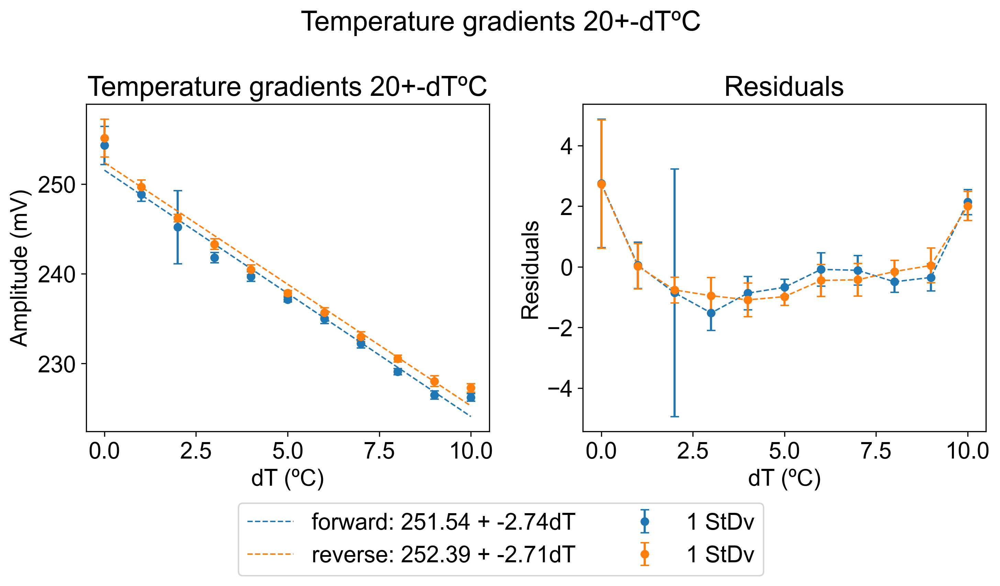

In [150]:
gh.plot_avg_fits(T_fits_df,
    suptitle = 'Temperature gradients 20+-dTºC', 
    t_type = 'dT',
    keys = ['amplitude_voltage_transmission_forward (mV)', # retrieve from dataframe
            'amplitude_voltage_transmission_reverse (mV)'], 
    title ='Temperature gradients 20+-dTºC',
    y_label = 'Amplitude (mV)'
)

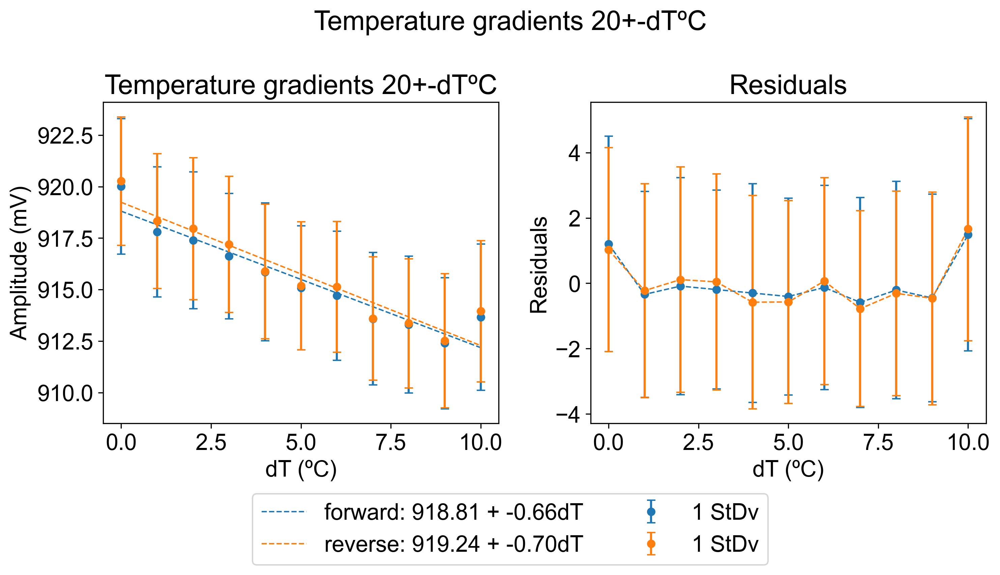

In [155]:
gh.plot_avg_fits(T_fits_df,
    suptitle = 'Temperature gradients 20+-dTºC', 
    t_type = 'dT',
    keys = ['Hilbert_noise_Tof_voltage_transmission_forward (ns)', # retrieve from dataframe
            'Hilbert_noise_Tof_voltage_transmission_reverse (ns)'], 
    title ='Temperature gradients 20+-dTºC',
    y_label = 'Amplitude (mV)'
)

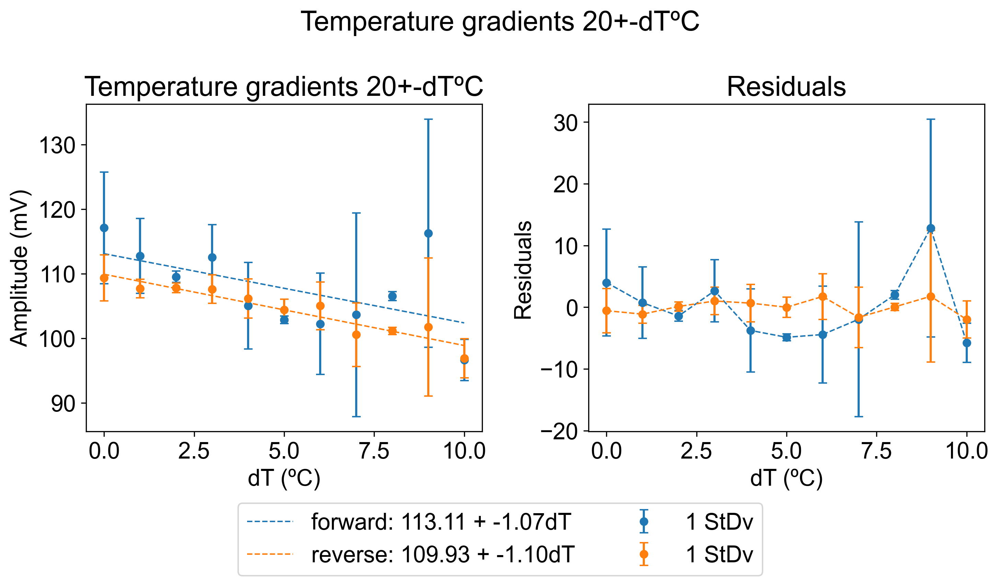

In [156]:
gh.plot_avg_fits(T_fits_df,
    suptitle = 'Temperature gradients 20+-dTºC', 
    t_type = 'dT',
    keys = ['amplitude_voltage_echo_forward (mV)', # retrieve from dataframe
            'amplitude_voltage_echo_reverse (mV)'], 
    title ='Temperature gradients 20+-dTºC',
    y_label = 'Amplitude (mV)'
)

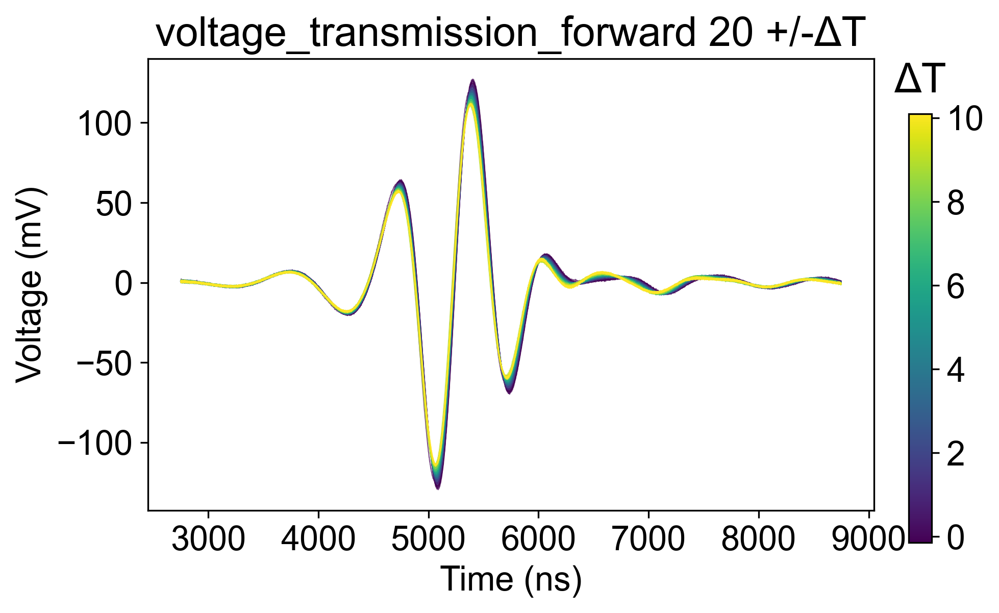

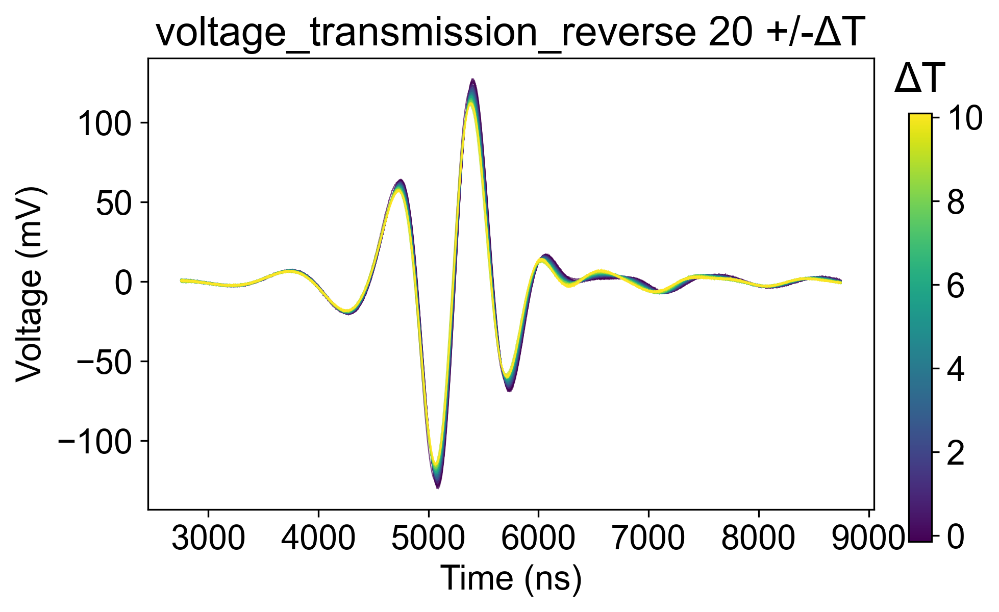

In [165]:
for k in ['voltage_transmission_forward', 'voltage_transmission_reverse']:
    gh.plot_overall_waveforms(merged_filtered_df,
                                            temps = [(20+i/2, 20-i/2) for i in range(11)],
                                            key=k,
                                            crop=[0,3000]
                                            )

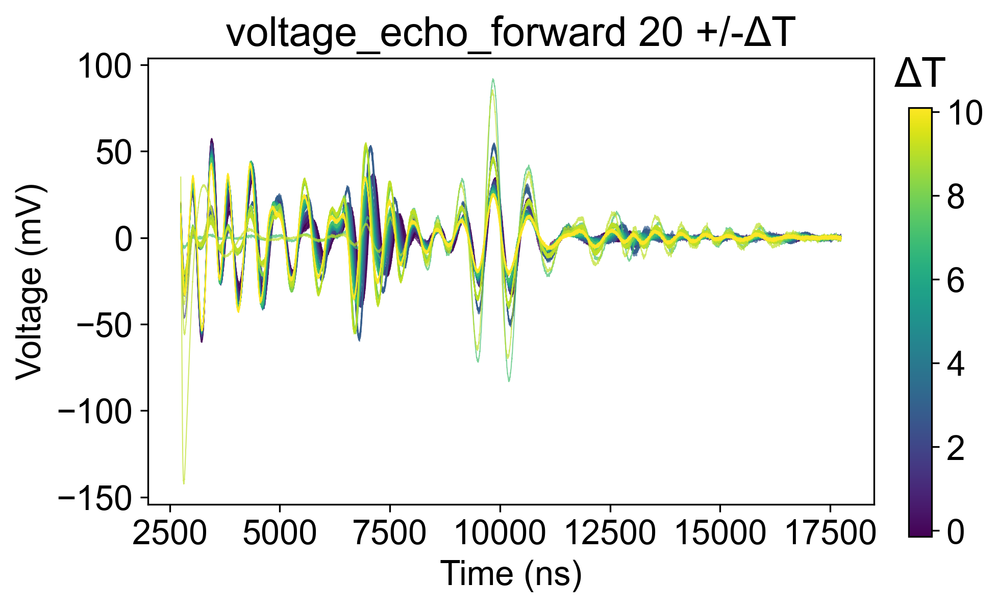

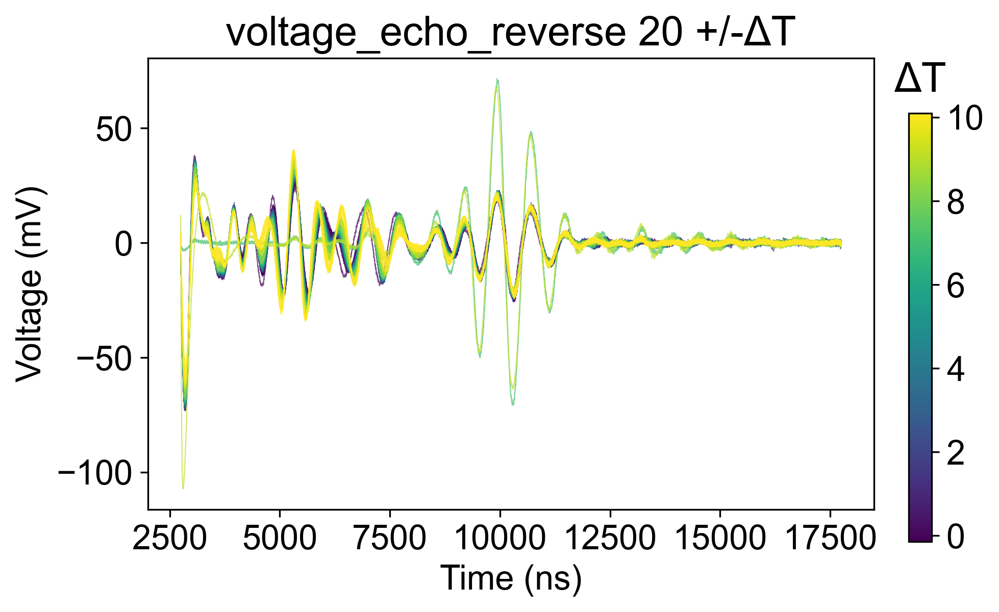

In [166]:
for k in ['voltage_echo_forward', 'voltage_echo_reverse']:
    gh.plot_overall_waveforms(merged_filtered_df,
                                            temps = [(20+i/2, 20-i/2) for i in range(11)],
                                            key=k,
                                            )

## Stat tests

### PCA

In [167]:
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.pipeline import Pipeline
scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())]) # scaler inputs are in format 

Normally, data going into sklearn modules should have shape (n_samples, n_features). In the case of spectral data, each scan is a sample, and each point in time is a feature.

However in this case, we normalize the flattened data because we do not want to erase the effects of amplitude changes between scans.

#### For monitoring parameters

In [216]:
full_monitor_df = gh.load_and_merge_all_controller_columns(merged_filtered_df, monitor_file_path_list, settings_file_path_list)

Loading and merging controller logs


In [217]:
full_monitor_df

,voltageOffsetForward,gainForward,voltageOffsetReverse,gainReverse,time_collected,collection_index,exp_idx,Time_x,1000.1: CH1 Object,1000.2: CH2 Object,...,65009.2: Level CH2,65010.1: Level 1A,65010.2: Level 2A,65011.1: Level 1B,65011.2: Level 2B,65020.1: MeParFlashV2 Write Cycles,3010.1: Kp,3010.2: Kp,3011.1: Ti,3011.2: Ti
0,0.462251,400.0,0.537154,400.0,1.785944e+09,170.0,0,1.785944e+09,20.061243,19.910456,...,-5.881372,6.953125,4.821429,13.035714,15.167411,1716,8,8,90,90
1,0.465531,400.0,0.540677,400.0,1.785944e+09,200.0,0,1.785944e+09,20.071009,19.984583,...,-5.689002,7.064732,4.988839,12.924108,15.000000,1716,8,8,90,90
2,0.469504,400.0,0.545847,400.0,1.785944e+09,250.0,0,1.785944e+09,20.096979,19.992212,...,-5.582299,7.287946,5.089286,12.700892,14.899553,1716,8,8,90,90
3,0.472211,400.0,0.545739,400.0,1.785944e+09,260.0,0,1.785944e+09,19.966120,20.006220,...,-5.553951,7.131696,5.100446,12.857142,14.888392,1716,8,8,90,90
4,0.471906,400.0,0.547157,400.0,1.785944e+09,270.0,0,1.785944e+09,20.089136,20.012018,...,-5.539256,7.276786,5.111607,12.712053,14.877233,1716,8,8,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3837,0.555748,400.0,0.617626,400.0,1.785987e+09,3473.0,10,1.785987e+09,25.007288,15.034693,...,6.246810,5.390625,15.491072,14.598214,4.497768,1740,10,10,120,120
3838,0.555369,400.0,0.618455,400.0,1.785987e+09,3483.0,10,1.785987e+09,25.045984,15.055231,...,6.327644,5.446429,15.569197,14.542411,4.419643,1740,10,10,120,120
3839,0.556316,400.0,0.618361,400.0,1.785987e+09,3493.0,10,1.785987e+09,25.016840,15.057703,...,6.375941,5.412946,15.613839,14.575892,4.375000,1740,10,10,120,120
3840,0.5561,400.0,0.617972,400.0,1.785987e+09,3503.0,10,1.785987e+09,24.994165,15.073938,...,6.452147,5.368304,15.669642,14.620536,4.319196,1740,10,10,120,120


In [218]:
X_scaled = scaler.fit_transform(full_monitor_df)
scaled_df = pd.DataFrame(X_scaled, columns=full_monitor_df.columns)

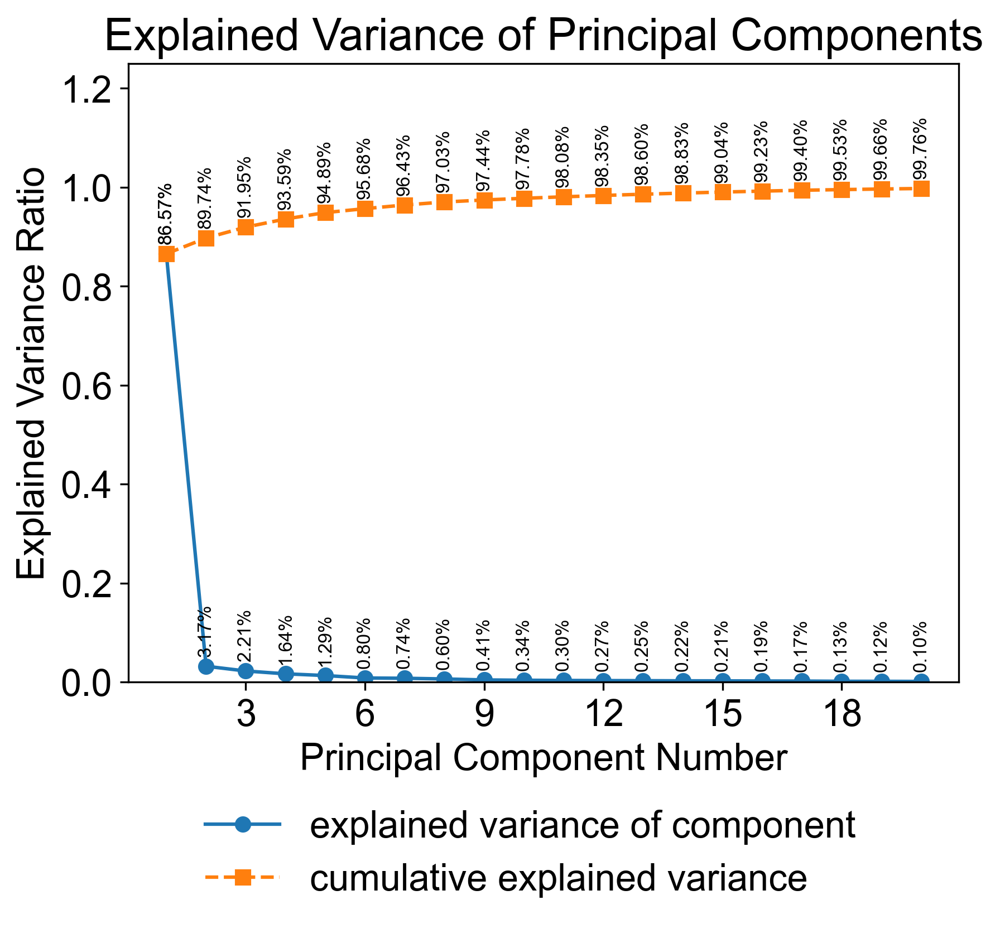

In [219]:
gh.plot_pca_variance(X_scaled, components=20) # we can pick 15 components

In [258]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
transformed = pca.fit_transform(scaled_df)

In [ ]:
loadings_df = gh.get_pca_loadings(pca)

,PC: 1,PC: 2,PC: 3,PC: 4,PC: 5,PC: 6,PC: 7,PC: 8,PC: 9,PC: 10
voltageOffsetForward,0.041575,-0.172549,0.316672,0.525635,0.209768,-0.030209,0.066305,0.416440,0.016572,-0.002814
gainForward,0.033175,-0.185819,0.221716,0.525454,0.075334,0.013305,0.006027,0.069933,0.001318,-0.011474
voltageOffsetReverse,-0.000564,0.013901,0.068354,0.048077,0.017714,0.031174,-0.029595,-0.211746,0.008912,0.042801
gainReverse,0.004162,-0.041361,0.028485,0.154779,-0.068928,0.055538,-0.058525,-0.366237,-0.001115,0.027670
time_collected,0.129860,0.014917,0.013068,-0.003797,0.057614,-0.017766,0.002957,-0.027334,-0.008600,-0.006076
...,...,...,...,...,...,...,...,...,...,...
65020.1: MeParFlashV2 Write Cycles,0.123028,0.035946,-0.031348,0.010548,-0.012717,0.033390,-0.025238,0.011841,-0.002173,-0.001190
3010.1: Kp,0.004122,0.157796,-0.074488,0.115873,0.031393,0.375797,-0.234864,0.138950,-0.002892,-0.045916
3010.2: Kp,0.004122,0.157796,-0.074488,0.115873,0.031393,0.375797,-0.234864,0.138950,-0.002892,-0.045916
3011.1: Ti,0.029615,0.342235,-0.194588,0.153705,-0.033155,0.255073,-0.133041,0.070176,0.000438,-0.011328


In [ ]:
gh.plotly_loadings_heatmap(loadings_df)

In [ ]:
top_10_df = gh.get_top_loadings(loadings_df, top_n=10)

(<Figure size 2100x1800 with 2 Axes>,
 <Axes: title={'center': "Colors: '1011.1: CH1 Ramp' (PC: 1, rank 1)"}, xlabel='PC: 1', ylabel='PC: 2'>)

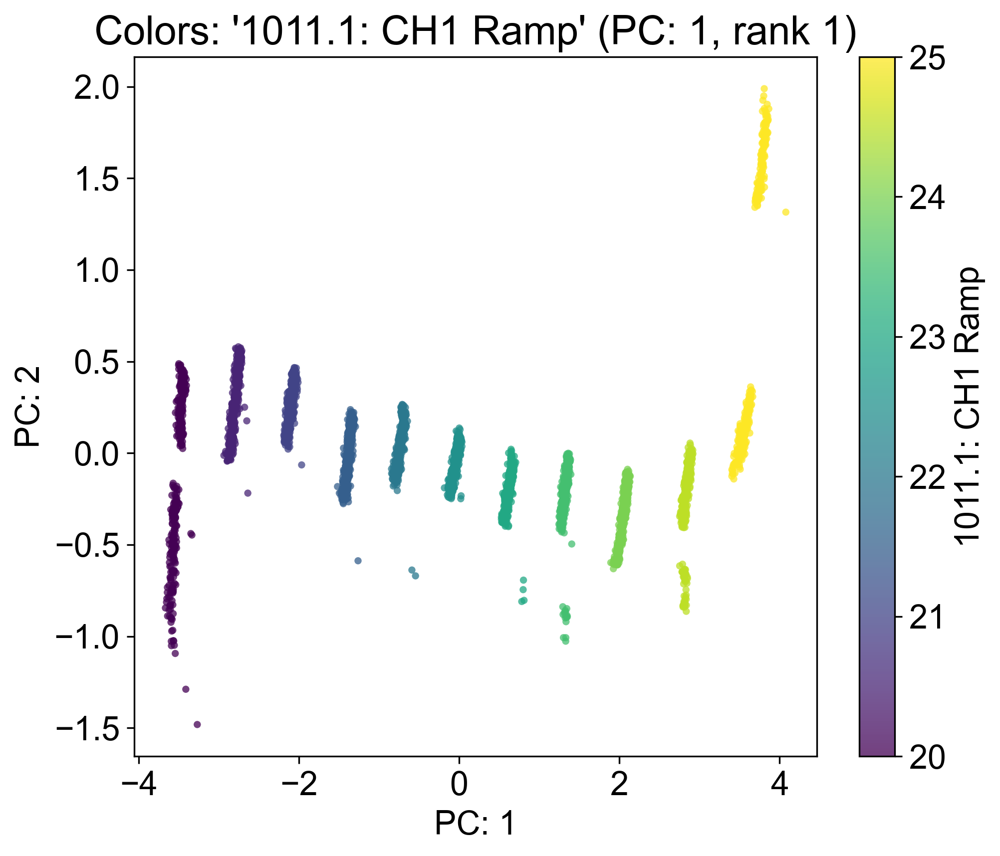

In [ ]:
gh.plot_pc_scores_by_rank(top_10_df, transformed, pc_x=1, pc_y=2, color_pc=1, rank=1)

### for waveforms

In [1]:
import numpy as np

signal_keys = ['voltage_transmission_forward', 'voltage_transmission_reverse', 'voltage_echo_forward', 'voltage_echo_reverse']

X =np.stack( [ np.stack(merged_filtered_df[key].values) for key in signal_keys ] )

data_rescaled = scaler.fit_transform(X.reshape(-1, 1)).reshape(X.shape)
data_rescaled.shape

NameError: name 'merged_filtered_df' is not defined

We do not usually need all components to capture trends in the data. Almost all variance is explained in the first 6 components

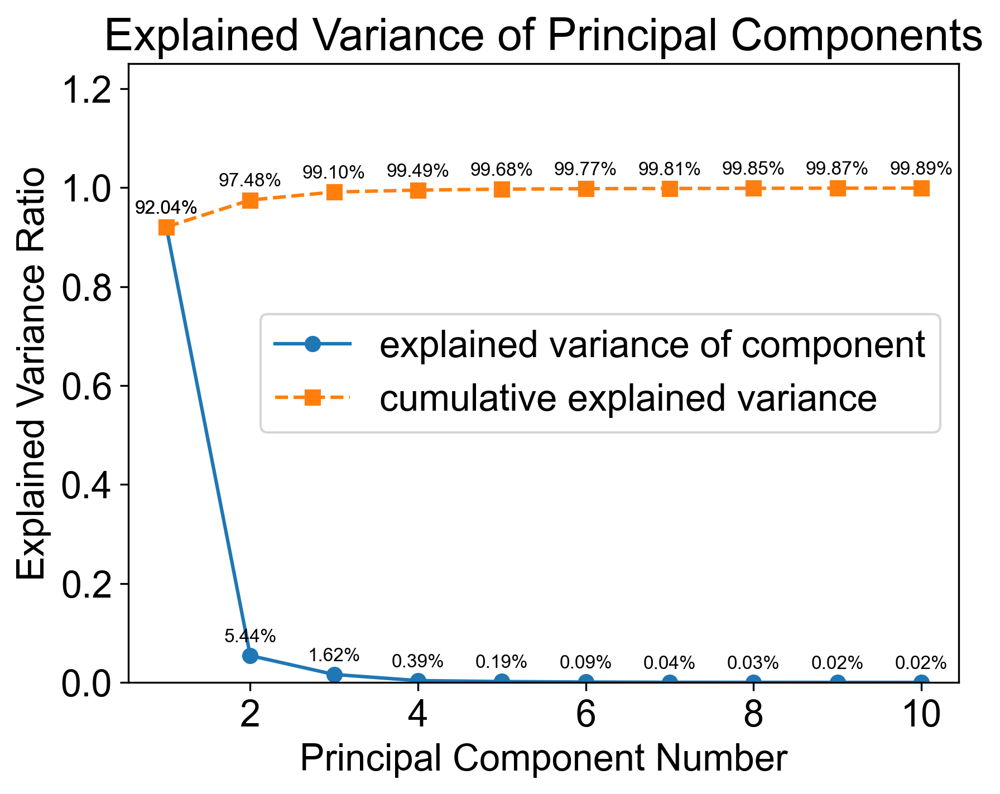

In [ ]:
from  sklearn.decomposition import PCA
from tqdm import tqdm

components=10
pca = PCA(n_components=components)
transformed = pca.fit_transform(data_rescaled.reshape(-1, data_rescaled.shape[-1])).reshape(data_rescaled.shape[0], data_rescaled.shape[1], components)

fig, ax = plt.subplots()
x = np.arange(1, components + 1)
explained = pca.explained_variance_ratio_
cumulative = np.cumsum(explained)

ax.plot(x, explained, marker='o', label='explained variance of component')
for xi, ex in zip(x, explained):  ax.text(xi, ex + 0.02, f'{ex:.2%}', ha='center', va='bottom', fontsize=8)

ax.plot(x, cumulative, marker='s', linestyle='--', label='cumulative explained variance')
for xi, cum in zip(x, cumulative):  ax.text(xi, cum + 0.02, f'{cum:.2%}', ha='center', va='bottom', fontsize=8)

ax.set_title('Explained Variance of Principal Components')
ax.set_xlabel('Principal Component Number')
ax.set_ylabel('Explained Variance Ratio')
ax.set_ylim(0, 1.25)
fig.legend(loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.02), frameon=False)

In [ ]:
import math
import matplotlib.colors as mcolors

def plot_PCs(transformed, pc_s, color_by_column, marker_categories=0, skip_=10):
    '''Plot scatter plots of the first 6 principal components'''
    color_vals = merged_filtered_df[color_by_column].values
    cvals = color_vals[::skip_]
    norm = mcolors.Normalize(vmin=cvals.min(), vmax=cvals.max())  # fixed range, built once
    cmap = plt.cm.viridis

    markers_ = ['o','^','v', 's','x', '_','.', '+',  '*', '<', '>', 'p', 'h']
        
    combos = math.comb(pc_s, 2)
    x_, y_ = int(combos**0.5), math.ceil(combos/int(combos**0.5))
    fig, ax = plt.subplots(x_, y_, figsize=(3*y_+0.5, 3*x_))
    fig.suptitle(f'PCA Scatter Plots comparing First {pc_s} Principal Components, colored by {color_by_column} value')
    ax = ax.flatten()
    if combos < x_*y_:
        for a in ax[-(x_*y_-combos):]: fig.delaxes(a)  # remove any extra axes if the grid is larger than the number of combinations

    ind = 0
    for i in range(pc_s):
        for j in range(i+1, pc_s):
            
            if marker_categories:
                for m,label in enumerate(marker_categories):
                    ax[ind].scatter(transformed[m, :, i][::skip_], transformed[m, :, j][::skip_], 
                                     marker=markers_[m], s=y_*10, linewidths=0.25,
                                     edgecolors=cmap(norm(color_vals[::skip_])),
                                     facecolors='none', label=label)
                    
                fig.legend(labels=marker_categories, loc='lower center', ncol=len(marker_categories), bbox_to_anchor=(0.5, -0.05))
                    
            else: ax[ind].scatter(transformed[:, i][::skip_], transformed[:, j][::skip_], marker='o', s=y_*10, c=color_vals[::skip_], cmap=cmap, norm=norm)

            ax[ind].set_title(f'x:PC{i+1}, y:PC{j+1}')
            ind += 1
            
    fig.tight_layout()
    # carve out space on the right, then place a colorbar axes there
    fig.subplots_adjust(right=0.90)
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height] in figure coords
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, cax=cbar_ax, label=f'{color_by_column}')

In [ ]:
merged_filtered_df.columns # select which column to color by

Index(['voltage_transmission_forward', 'voltage_transmission_reverse', 'time',
       'time_collected', 'collection_index', 'exp_idx', 'Time',
       '1000.1: CH1 Object', '1000.2: CH2 Object', '1001.1: CH1 Sink',
       '1001.2: CH2 Sink', '1044.1: LR1 Temp', '1044.2: LR2 Temp',
       '1044.3: LR3 Temp', '1045.1: HR1 Temp', '1045.2: HR2 Temp',
       '3000.1: CH1 Target', '3000.2: CH2 Target', '105.1: Error Number',
       '106.1: Error Inst', '107.1: Error Param',
       '1200.1: Temperature is Stable', '1200.2: Temperature is Stable',
       '2010.1: Output Enable', '2010.2: Output Enable',
       '3034.1: Peltier Polarity', '3034.2: Peltier Polarity', 'Time_str',
       'index', 'mean_T (°C)', 'diff_T (°C)', 'amplitude_forward (mV)',
       'Hilbert_ToF_forward (ns)', 'Hilbert_noise_Tof_forward (ns)',
       'max_forward (mV)', 'amplitude_reverse (mV)',
       'Hilbert_ToF_reverse (ns)', 'Hilbert_noise_Tof_reverse (ns)',
       'max_reverse (mV)'],
      dtype='str')

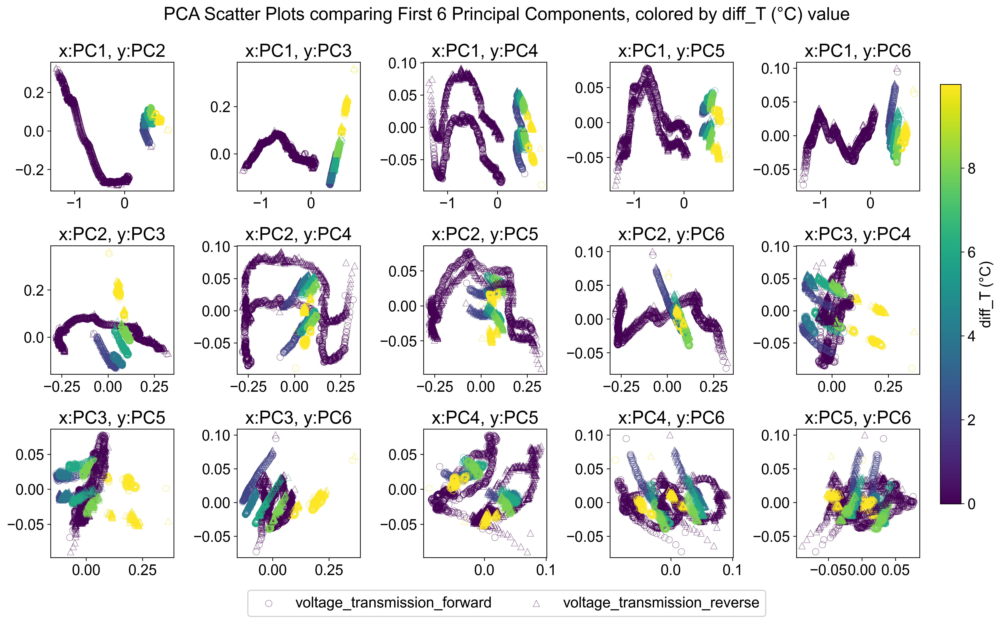

In [ ]:
plot_PCs(transformed=transformed, 
         pc_s=6,
         color_by_column='diff_T (°C)',
         marker_categories=['voltage_transmission_forward', 'voltage_transmission_reverse'])

In [ ]:
merged_filtered_df['amplitude_diff'] = merged_filtered_df['amplitude_forward (mV)']-merged_filtered_df['amplitude_reverse (mV)']

(array([8.000e+00, 4.900e+01, 2.310e+02, 6.580e+02, 1.433e+03, 2.362e+03,
        2.586e+03, 1.752e+03, 8.400e+02, 3.640e+02, 2.210e+02, 1.020e+02,
        6.400e+01, 3.700e+01, 5.200e+01, 9.300e+01, 1.350e+02, 1.910e+02,
        2.180e+02, 2.600e+02, 3.080e+02, 4.600e+02, 6.620e+02, 9.000e+02,
        9.140e+02, 6.440e+02, 2.520e+02, 7.600e+01, 7.000e+00, 2.000e+00]),
 array([-0.01060286, -0.00983411, -0.00906535, -0.0082966 , -0.00752784,
        -0.00675909, -0.00599034, -0.00522158, -0.00445283, -0.00368407,
        -0.00291532, -0.00214656, -0.00137781, -0.00060906,  0.0001597 ,
         0.00092845,  0.00169721,  0.00246596,  0.00323472,  0.00400347,
         0.00477222,  0.00554098,  0.00630973,  0.00707849,  0.00784724,
         0.008616  ,  0.00938475,  0.0101535 ,  0.01092226,  0.01169101,
         0.01245977]),
 <BarContainer object of 30 artists>)

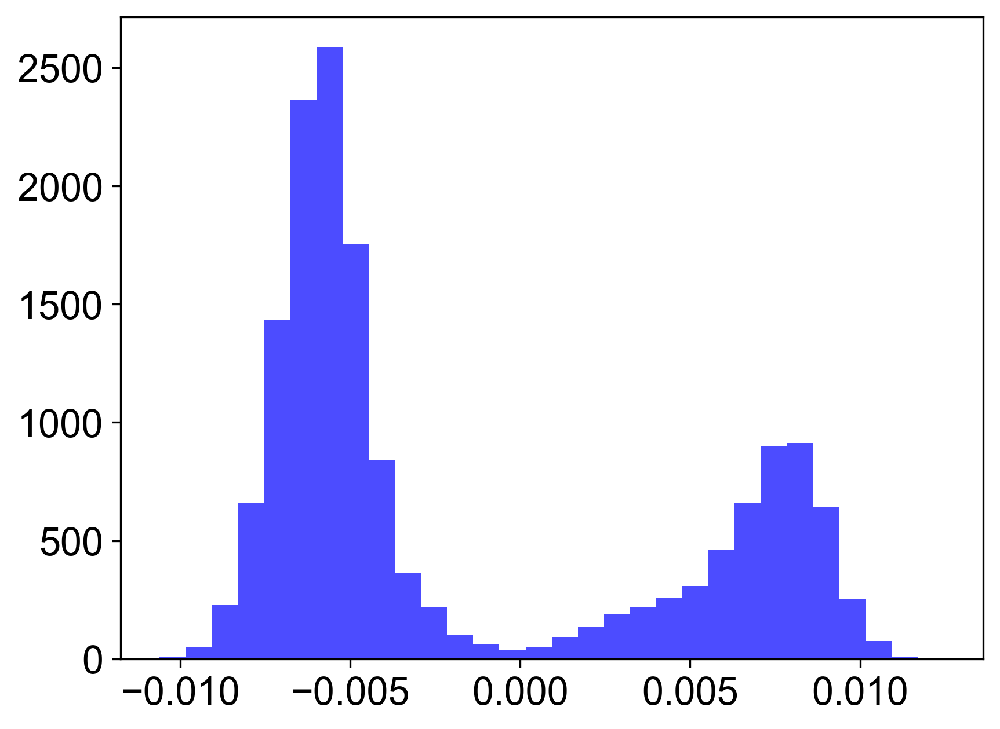

In [ ]:
plt.hist(merged_filtered_df['amplitude_diff'], bins=30, color='blue', alpha=0.7)

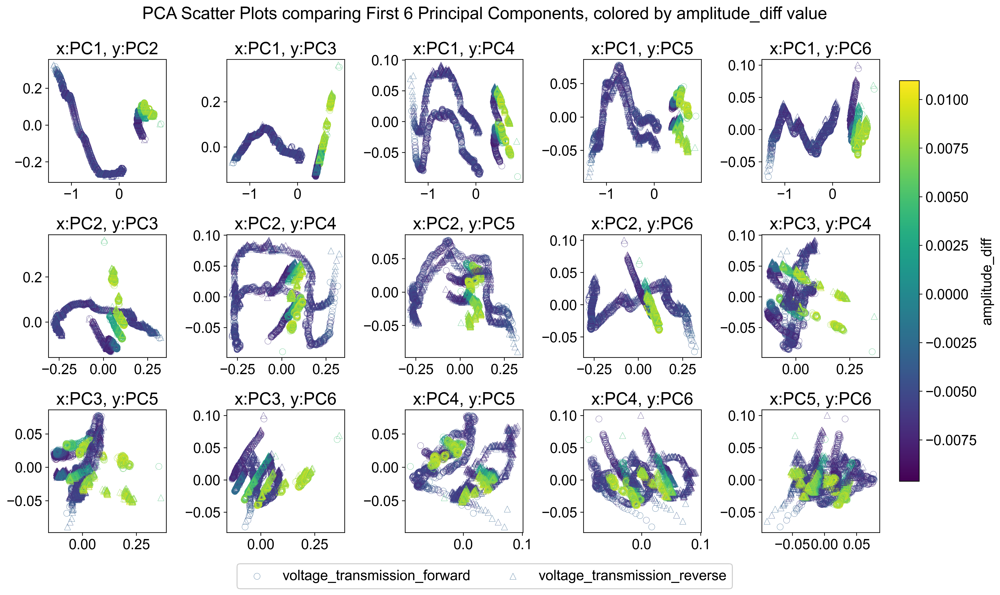

In [ ]:
plot_PCs(transformed=transformed, 
         pc_s=6,
         color_by_column='amplitude_diff',
         marker_categories=['voltage_transmission_forward', 'voltage_transmission_reverse'],
         skip_=10)

### PCA by exp parameters